# Brazilian E-Commerce Public Dataset by Olist

### Package installation and dataset importation

In [1]:
install.packages("gridExtra")
install.packages("lattice")
install.packages("caret")
install.packages("kableExtra")

package 'gridExtra' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\kibas\AppData\Local\Temp\RtmpCWCeJf\downloaded_packages
package 'lattice' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\kibas\AppData\Local\Temp\RtmpCWCeJf\downloaded_packages
package 'caret' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\kibas\AppData\Local\Temp\RtmpCWCeJf\downloaded_packages


also installing the dependency 'webshot'



package 'webshot' successfully unpacked and MD5 sums checked
package 'kableExtra' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\kibas\AppData\Local\Temp\RtmpCWCeJf\downloaded_packages


In [42]:
library(dplyr)
library(ggplot2)
library(lubridate)
library(knitr)
library(gridExtra)
library(lattice)
library(caret)
library(kableExtra)

In [43]:
Customers <- read.csv(("data/olist_customers_dataset.csv"), header = TRUE)
Geolocation <- read.csv("data/olist_geolocation_dataset.csv", header = TRUE)
Items <- read.csv(("data/olist_order_items_dataset.csv"), header = TRUE)
Payments <- read.csv("data/olist_order_payments_dataset.csv", header = TRUE)
Reviews <- read.csv("data/olist_order_reviews_dataset.csv", header = TRUE)
Orders <- read.csv("data/olist_orders_dataset.csv", header = TRUE)
Products <- read.csv("data/olist_products_dataset.csv", header = TRUE)
Sellers <- read.csv("data/olist_sellers_dataset.csv", header = TRUE)
Pdttrans <- read.csv("data/product_category_name_translation.csv", header = TRUE)

In [4]:
head(Orders)

order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00
a4591c265e18cb1dcee52889e2d8acc3,503740e9ca751ccdda7ba28e9ab8f608,delivered,2017-07-09 21:57:05,2017-07-09 22:10:13,2017-07-11 14:58:04,2017-07-26 10:57:55,2017-08-01 00:00:00


In [5]:
head(Customers)

customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
879864dab9bc3047522c92c82e1212b8,4c93744516667ad3b8f1fb645a3116a4,89254,jaragua do sul,SC


In [6]:
head(Geolocation)

geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
1037,-23.54562,-46.63929,sao paulo,SP
1046,-23.54608,-46.64482,sao paulo,SP
1046,-23.54613,-46.64295,sao paulo,SP
1041,-23.54439,-46.63950,sao paulo,SP
1035,-23.54158,-46.64161,sao paulo,SP
1012,-23.54776,-46.63536,sÃ£o paulo,SP


In [7]:
head(Items)

order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
00048cc3ae777c65dbb7d2a0634bc1ea,1,ef92defde845ab8450f9d70c526ef70f,6426d21aca402a131fc0a5d0960a3c90,2017-05-23 03:55:27,21.90,12.69


In [8]:
head(Payments)

order_id,payment_sequential,payment_type,payment_installments,payment_value
b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
298fcdf1f73eb413e4d26d01b25bc1cd,1,credit_card,2,96.12


In [9]:
head(Products)

product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40,287,1,225,16,10,14
3aa071139cb16b67ca9e5dea641aaa2f,artes,44,276,1,1000,30,18,20
96bd76ec8810374ed1b65e291975717f,esporte_lazer,46,250,1,154,18,9,15
cef67bcfe19066a932b7673e239eb23d,bebes,27,261,1,371,26,4,26
9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37,402,4,625,20,17,13
41d3672d4792049fa1779bb35283ed13,instrumentos_musicais,60,745,1,200,38,5,11


In [10]:
head(Reviews)

review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,,,2018-01-18 00:00:00,2018-01-18 21:46:59
80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,,,2018-03-10 00:00:00,2018-03-11 03:05:13
228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,,,2018-02-17 00:00:00,2018-02-18 14:36:24
e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,,ParabÃ©ns lojas lannister adorei comprar pela Internet seguro e prÃ¡tico ParabÃ©ns a todos feliz PÃ¡scoa,2018-03-01 00:00:00,2018-03-02 10:26:53
15197aa66ff4d0650b5434f1b46cda19,b18dcdf73be66366873cd26c5724d1dc,1,,,2018-04-13 00:00:00,2018-04-16 00:39:37


In [11]:
head(Sellers)

seller_id,seller_zip_code_prefix,seller_city,seller_state
3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP
c240c4061717ac1806ae6ee72be3533b,20920,rio de janeiro,RJ


In [12]:
head(Pdttrans)

ï..product_category_name,product_category_name_english
beleza_saude,health_beauty
informatica_acessorios,computers_accessories
automotivo,auto
cama_mesa_banho,bed_bath_table
moveis_decoracao,furniture_decor
esporte_lazer,sports_leisure


## gestion de donnée d'un projet R sur ce dataset

In [44]:

Orders <- mutate(Orders, Est.Lead.t = interval(ymd_hms(Orders$order_purchase_timestamp), ymd_hms(Orders$order_estimated_delivery_date)) %/% days(x = 1))
Orders <- mutate(Orders, Act.Lead.t = interval(ymd_hms(Orders$order_purchase_timestamp), ymd_hms(Orders$order_delivered_customer_date)) %/% days(x = 1))
Orders <- mutate(Orders, Approval.mins = interval(ymd_hms(Orders$order_purchase_timestamp), ymd_hms(Orders$order_approved_at)) %/% minutes(x = 1))
Orders <- mutate(Orders, Appr.to.Car = interval(ymd_hms(Orders$order_purchase_timestamp), ymd_hms(Orders$order_delivered_carrier_date)) %/% days(x = 1))
Orders <- mutate(Orders, Car.to.Cus = interval(ymd_hms(Orders$order_delivered_carrier_date), ymd_hms(Orders$order_delivered_customer_date)) %/% days(x = 1))
Orders <- mutate(Orders, purchase_quart = quarter(Orders$order_purchase_timestamp, with_year = TRUE))
Orders <- mutate(Orders, purchase_month = month(Orders$order_purchase_timestamp, label = FALSE , abbr = FALSE))
Orders <- mutate(Orders, purchase_year = year(Orders$order_purchase_timestamp))

Items <- mutate(Items, order.price = (order_item_id*price))
Items <- mutate(Items, order.freight = (order_item_id*freight_value))
Items <- mutate(Items, total.order.cost = (order.price + order.freight))
Items <- mutate(Items, fr.sup.pr = if_else(freight_value >= price, 1, 0))

In [26]:
head(Orders)

order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,Est.Lead.t,Act.Lead.t,Approval.mins,Appr.to.Car,Car.to.Cus,purchase_quart,purchase_month,purchase_year
e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,15,8,10,2,6,2017.4,10,2017
53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,19,13,1842,1,12,2018.3,7,2018
47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,26,9,16,0,9,2018.3,8,2018
949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,26,13,17,3,9,2017.4,11,2017
ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,12,2,61,0,1,2018.1,2,2018
a4591c265e18cb1dcee52889e2d8acc3,503740e9ca751ccdda7ba28e9ab8f608,delivered,2017-07-09 21:57:05,2017-07-09 22:10:13,2017-07-11 14:58:04,2017-07-26 10:57:55,2017-08-01 00:00:00,22,16,13,1,14,2017.3,7,2017


In [29]:
head(Items)

order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order.price,order.freight,total.order.cost,fr.sup.pr
00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,58.90,13.29,72.19,0
00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,239.90,19.93,259.83,0
000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,199.00,17.87,216.87,0
00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,12.99,12.79,25.78,0
00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,199.90,18.14,218.04,0
00048cc3ae777c65dbb7d2a0634bc1ea,1,ef92defde845ab8450f9d70c526ef70f,6426d21aca402a131fc0a5d0960a3c90,2017-05-23 03:55:27,21.90,12.69,21.90,12.69,34.59,0


### Exploitation des reviews

In [62]:
#Reviews$review_comment_message
#is.na(Reviews$review_comment_message)

In [30]:
Reviews %>% 
        summarise(count = sum(is.na(review_comment_message)))

count
2


In [29]:
# replacing with standard missing value type, NA
Reviews <- Reviews %>%
  mutate(review_comment_message = replace(review_comment_message, review_comment_message == "na", NA)) %>%
  mutate(review_comment_message = replace(review_comment_message, review_comment_message == "N/A", NA))

In [37]:
names(Reviews)

[1] "review_id"               "order_id"               
[3] "review_score"            "review_comment_title"   
[5] "review_comment_message"  "review_creation_date"   
[7] "review_answer_timestamp"

In [60]:
#Reviews %>% select(review_score,review_comment_message)
#        %>% filter(review_comment_message == "")
dim(filter(Reviews, review_comment_message != ""))

[1] 41754     7

In [63]:
names(Orders)

[1] "order_id"                      "customer_id"                  
 [3] "order_status"                  "order_purchase_timestamp"     
 [5] "order_approved_at"             "order_delivered_carrier_date" 
 [7] "order_delivered_customer_date" "order_estimated_delivery_date"
 [9] "Est.Lead.t"                    "Act.Lead.t"                   
[11] "Approval.mins"                 "Appr.to.Car"                  
[13] "Car.to.Cus"                    "purchase_quart"               
[15] "purchase_month"                "purchase_year"

In [67]:
clients_commander <- merge(Orders,Items)

In [71]:
names(clients_commander)

[1] "order_id"                      "customer_id"                  
 [3] "order_status"                  "order_purchase_timestamp"     
 [5] "order_approved_at"             "order_delivered_carrier_date" 
 [7] "order_delivered_customer_date" "order_estimated_delivery_date"
 [9] "Est.Lead.t"                    "Act.Lead.t"                   
[11] "Approval.mins"                 "Appr.to.Car"                  
[13] "Car.to.Cus"                    "purchase_quart"               
[15] "purchase_month"                "purchase_year"                
[17] "order_item_id"                 "product_id"                   
[19] "seller_id"                     "shipping_limit_date"          
[21] "price"                         "freight_value"                
[23] "order.price"                   "order.freight"                
[25] "total.order.cost"              "fr.sup.pr"

In [95]:
x <- clients_commander %>% group_by(order_status) %>% slice(2)

In [96]:
head(x)

order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,Est.Lead.t,Act.Lead.t,...,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order.price,order.freight,total.order.cost,fr.sup.pr
a2e4c44360b4a57bdff22f3a4630c173,8886130db0ea6e9e70ba0b03d7c0d286,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,,,2017-03-01 00:00:00,22,NA,...,2,dcecb611ba878d5d8c7853585b285c12,8cc6a0e5738e61a87b03c78b2ba9db4b,2017-02-10 20:18:17,19.85,10.96,39.70,21.92,61.62,0
00ae7a8b4936674ebb701d4a23719a79,a7e8a3cb55d9c9a536992c6465a46a3f,canceled,2018-05-09 14:14:06,2018-05-09 15:51:32,,,2018-05-17 00:00:00,7,NA,...,1,66f09a6de4f2ef63aaf5349b60a0e0c0,bf0d50a6410d487dc97d2baac0a8c0be,2018-05-15 15:51:32,27.90,9.26,27.90,9.26,37.16,0
00018f77f2f0320c557190d7a144bdd3,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,18,16,...,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,239.90,19.93,259.83,0
015fb6b5f739788434fa690540f90f19,eca9b206f2a9e4693bf0840895434e2c,invoiced,2017-01-31 13:06:05,2017-02-02 02:41:22,,,2017-03-09 00:00:00,36,NA,...,1,a0eccc912d428eaddf1ef4fe47593ece,8a87611c08849ffeeccab52aa798b6c7,2017-02-04 13:06:05,143.00,94.98,143.00,94.98,237.98,0
055f84fd2ebf314ebec85f8e1312f4f4,82ff01ff3cdbae8ef85c10481d360d1a,processing,2018-01-13 17:32:09,2018-01-15 10:10:50,,,2018-02-14 00:00:00,31,NA,...,1,a28d469a29d93b4ec13ce26150184e34,5ca5d579b5857ee8709479b1047cecc3,2018-01-19 10:10:50,169.90,15.94,169.90,15.94,185.84,0
00a99c50fdff7e36262caba33821875a,7a399396442d5601cbedfbd0a3cf1da4,shipped,2018-08-17 16:25:04,2018-08-17 16:35:18,2018-08-18 09:07:00,,2018-09-18 00:00:00,31,NA,...,1,76d75f398634bf194ba99d7297e7d1fa,974cf2cb8f4b7add98709c30df02fe10,2018-08-21 16:35:18,52.99,22.30,52.99,22.30,75.29,0


In [83]:
x <- unique(x$customer_id)

In [81]:
dim(x)

NULL

In [68]:
head(clients_commander, 100)

order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,Est.Lead.t,Act.Lead.t,...,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,order.price,order.freight,total.order.cost,fr.sup.pr
00010242fe8c5a6d1ba2dd792cb16214,3ce436f183e68e07877b285a838db11a,delivered,2017-09-13 08:59:02,2017-09-13 09:45:35,2017-09-19 18:34:16,2017-09-20 23:43:48,2017-09-29 00:00:00,15,7,...,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,58.90,13.29,72.19,0
00018f77f2f0320c557190d7a144bdd3,f6dd3ec061db4e3987629fe6b26e5cce,delivered,2017-04-26 10:53:06,2017-04-26 11:05:13,2017-05-04 14:35:00,2017-05-12 16:04:24,2017-05-15 00:00:00,18,16,...,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,239.90,19.93,259.83,0
000229ec398224ef6ca0657da4fc703e,6489ae5e4333f3693df5ad4372dab6d3,delivered,2018-01-14 14:33:31,2018-01-14 14:48:30,2018-01-16 12:36:48,2018-01-22 13:19:16,2018-02-05 00:00:00,21,7,...,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,199.00,17.87,216.87,0
00024acbcdf0a6daa1e931b038114c75,d4eb9395c8c0431ee92fce09860c5a06,delivered,2018-08-08 10:00:35,2018-08-08 10:10:18,2018-08-10 13:28:00,2018-08-14 13:32:39,2018-08-20 00:00:00,11,6,...,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,12.99,12.79,25.78,0
00042b26cf59d7ce69dfabb4e55b4fd9,58dbd0b2d70206bf40e62cd34e84d795,delivered,2017-02-04 13:57:51,2017-02-04 14:10:13,2017-02-16 09:46:09,2017-03-01 16:42:31,2017-03-17 00:00:00,40,25,...,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,199.90,18.14,218.04,0
00048cc3ae777c65dbb7d2a0634bc1ea,816cbea969fe5b689b39cfc97a506742,delivered,2017-05-15 21:42:34,2017-05-17 03:55:27,2017-05-17 11:05:55,2017-05-22 13:44:35,2017-06-06 00:00:00,21,6,...,1,ef92defde845ab8450f9d70c526ef70f,6426d21aca402a131fc0a5d0960a3c90,2017-05-23 03:55:27,21.90,12.69,21.90,12.69,34.59,0
00054e8431b9d7675808bcb819fb4a32,32e2e6ab09e778d99bf2e0ecd4898718,delivered,2017-12-10 11:53:48,2017-12-10 12:10:31,2017-12-12 01:07:48,2017-12-18 22:03:38,2018-01-04 00:00:00,24,8,...,1,8d4f2bb7e93e6710a28f34fa83ee7d28,7040e82f899a04d1b434b795a43b4617,2017-12-14 12:10:31,19.90,11.85,19.90,11.85,31.75,0
000576fe39319847cbb9d288c5617fa6,9ed5e522dd9dd85b4af4a077526d8117,delivered,2018-07-04 12:08:27,2018-07-05 16:35:48,2018-07-05 12:15:00,2018-07-09 14:04:07,2018-07-25 00:00:00,20,5,...,1,557d850972a7d6f792fd18ae1400d9b6,5996cddab893a4652a15592fb58ab8db,2018-07-10 12:30:45,810.00,70.75,810.00,70.75,880.75,0
0005a1a1728c9d785b8e2b08b904576c,16150771dfd4776261284213b89c304e,delivered,2018-03-19 18:40:33,2018-03-20 18:35:21,2018-03-28 00:37:42,2018-03-29 18:17:31,2018-03-29 00:00:00,9,9,...,1,310ae3c140ff94b03219ad0adc3c778f,a416b6a846a11724393025641d4edd5e,2018-03-26 18:31:29,145.95,11.65,145.95,11.65,157.60,0
0005f50442cb953dcd1d21e1fb923495,351d3cb2cee3c7fd0af6616c82df21d3,delivered,2018-07-02 13:59:39,2018-07-02 14:10:56,2018-07-03 14:25:00,2018-07-04 17:28:31,2018-07-23 00:00:00,20,2,...,1,4535b0e1091c278dfd193e5a1d63b39f,ba143b05f0110f0dc71ad71b4466ce92,2018-07-06 14:10:56,53.99,11.40,53.99,11.40,65.39,0


### Nombre des mots regroupé par score 

In [59]:
#xxx <- factor(Reviews[2:10,c('review_comment_message')])
#xxx
head(Reviews$review_comment_message,10, max.levels = 0)

[1]                                                                                                                                                                                
 [2]                                                                                                                                                                                
 [3]                                                                                                                                                                                
 [4] Recebi bem antes do prazo estipulado.                                                                                                                                          
 [5] ParabÃ©ns lojas lannister adorei comprar pela Internet seguro e prÃ¡tico ParabÃ©ns a todos feliz PÃ¡scoa                                                                       
 [6]                                                                                                                                                                                
 [7]                                                                                                                                                                                
 [8]                                                                                                                                                                                
 [9]                                                                                                                                                                                
[10] aparelho eficiente. no site a marca do aparelho esta impresso como 3desinfector e ao chegar esta com outro nome...atualizar com a marca correta uma vez que Ã© o mesmo aparelho
36923 Levels:  ... Zero responsabilidade

In [55]:
#order_review_data['word_count'] = order_review_data.review_comment_message.apply(lambda x: len(str(x).split()))
#saida["word_count"] = Reviews$review_comment_message.apply
xxx <- Reviews[200,c('review_comment_message')]
Reviews["word_count"] <- lapply(xxx, 
                                function(x) 
                                    if (!is.na(x) && !is.factor(x)) 
                                        {
                                        print(x)
                                        tryCatch(
                                            expr = {
                                               length(strsplit(x, " "))
                                            },
                                            error = function(e){ 
                                                # (Optional)
                                                # Do this if an error is caught...
                                                print(e)
                                            }
                                         )
                                    })

#lapply(xxx, function(x) if (!is.na(x)) { print(x) } )

In [57]:
Reviews$word_count2

NULL

In [21]:
print(length("sdsd sfsf"))

[1] 1


In [45]:
print(length(Reviews$review_comment_message))

[1] 100000


In [50]:
word_counts <- vector()
for (item in Reviews$review_comment_message)
{
    word_counts <- c(word_counts,sapply(strsplit(item, " "), length))
}

In [ ]:
print(length(Reviews$review_comment_message))

In [52]:
length(word_counts)

[1] 100000

In [54]:
Reviews$word_counts = word_counts

In [37]:
#Reviews <- rbind(Reviews, data.frame(wor,d_counts = word_counts))
#Reviews["word_counts"]

ERROR: Error in `[.data.frame`(Reviews, "word_counts"): undefined columns selected


In [56]:
#names(Reviews)
g = sns.FacetGrid(data=order_review_data, col='review_score',height=5, aspect=0.8)
before_remove = g.map(plt.hist, 'word_count', bins=30)
before_remove

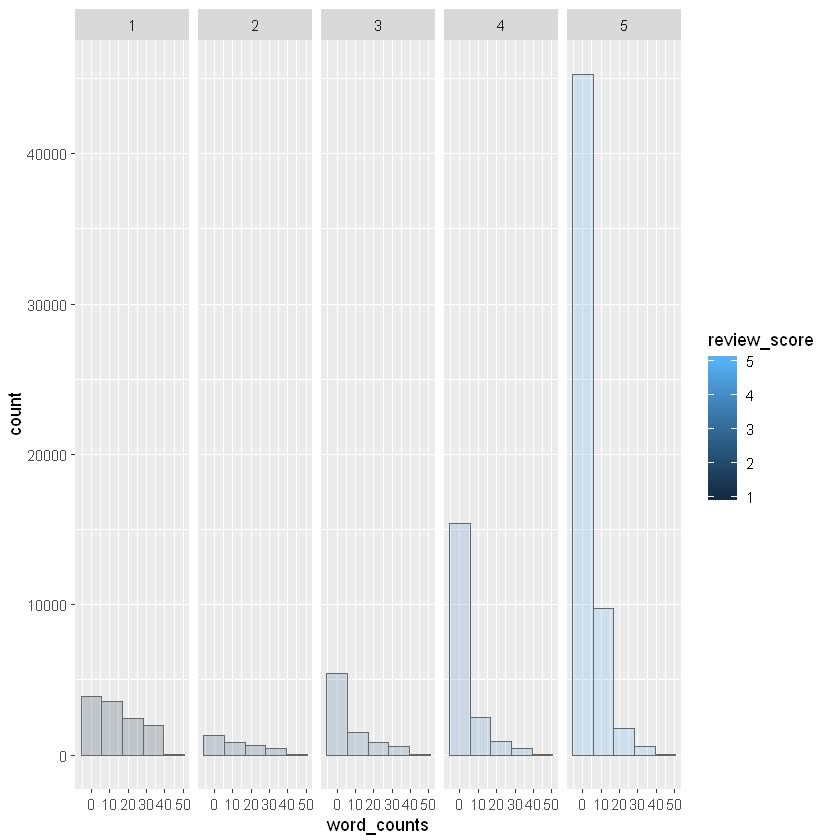

In [64]:
p = ggplot(Reviews, aes(x=word_counts, fill=review_score)) +
    geom_histogram(position="identity", colour="grey40", alpha=0.2, bins = 5) +
    facet_grid(. ~ review_score)
p

In [79]:
#Box plots basiques
p <- ggplot(Reviews, aes(x=review_score, y=word_counts)) + 
  geom_boxplot()
p

ERROR: Error in ggplot(Reviews, aes(x = review_score, y = word_counts)): objet 'Reviews' introuvable


In [76]:
rm(list = ls())
library(datasets)
library(ggplot2)

data(airquality)
airquality$Month <- factor(airquality$Month, labels = c("May", "Jun", "Jul", "Aug", "Sep"))


In [77]:
airquality$Month

[1] May May May May May May May May May May May May May May May May May May
 [19] May May May May May May May May May May May May May Jun Jun Jun Jun Jun
 [37] Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun Jun
 [55] Jun Jun Jun Jun Jun Jun Jun Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul
 [73] Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul Jul
 [91] Jul Jul Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug
[109] Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Aug Sep Sep Sep
[127] Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep Sep
[145] Sep Sep Sep Sep Sep Sep Sep Sep Sep
Levels: May Jun Jul Aug Sep

Warning message:
"Removed 37 rows containing non-finite values (stat_boxplot)."

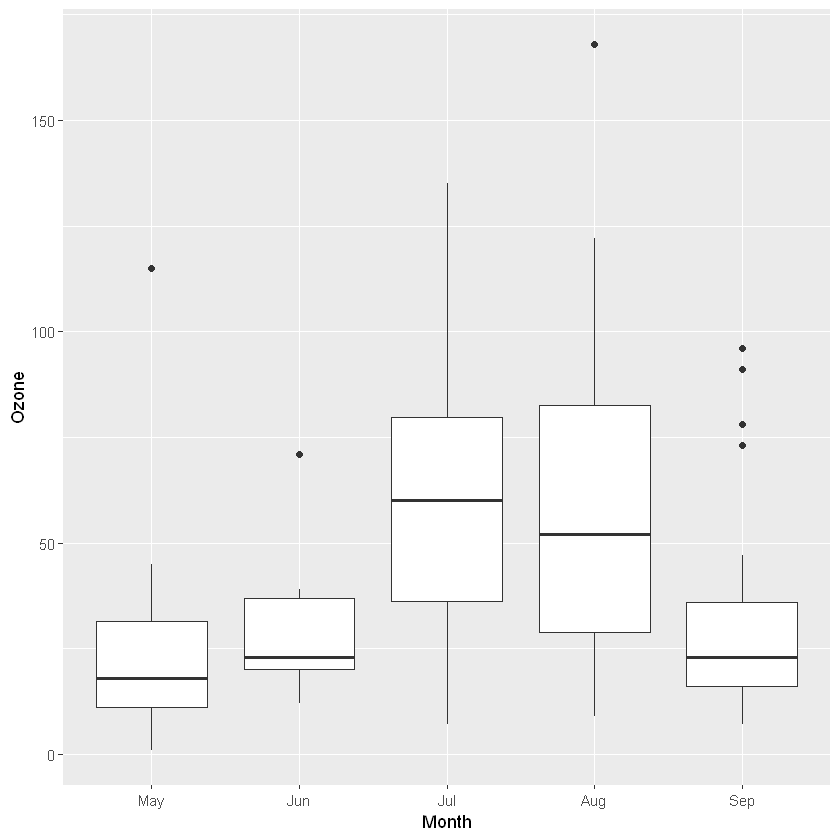

In [70]:
p10 <- ggplot(airquality, aes(x = Month, y = Ozone)) +
        geom_boxplot()
p10